# Downloading, Preparing, and Analyzing COVID-19 Data for an Analysis Dashboard

##### Esri  | Author: Jie Liu | Edits: Alberto Nieto

This notebook downloads, prepares, visualizes, and runs geoprocessing analysis tools related to COVID-19 case counts for counties in the United States. 

# Introduction

This notebook is composed of three sections:
1. Data retrieving and data engineering
2. Data visualization
3. Analysis

# 1. Data Retrieving and Data Engineering

This section of the notebook downloads and prepares data for use with ArcGIS Pro's spatial data science tools. 

## Step 1: Download data from USAFacts

The CSV files (known cases, deaths, population for US counties) are downloaded from the <a href="https://usafacts.org/visualizations/coronavirus-covid-19-spread-map/" target="_blank">USAFacts</a> website. It’s a non-profit provider of policy, economic and demographic data, and the COVID-19 confirmed cases and death counts are updated daily.

Alternatively, there are many other different data source for COVID-19. You may edit the code and API to retrieve  the data from the <a href="https://github.com/nytimes/covid-19-data" target="_blank">New York Times COVID-19 data repository or use the JHU dashboard data stored on our <a href="https://coronavirus-disasterresponse.hub.arcgis.com/" target="_blank">COVID-19 GIS Hub</a>. Choose the one that you feel the most comfortable with and start from there. 

In [7]:
import os                           # Used for interaction with the operating system
import pandas as pd                 # Used for data management
import numpy as np                  # Used for array data structures
import matplotlib.pyplot as plt     # Used for plotting
import requests                     # Used to make HTML requests
import arcgis                       # Used to interact with Esri Living Atlas
import arcpy                        # Used to run data visualization and run analyses

# show plots after Notebook cells
%matplotlib inline        

In [8]:
# Set overwrite permissions and workspace
arcpy.env.overwriteOutput = True
workGDB = arcpy.env.workspace
workFolder = os.path.join(os.path.dirname(workGDB), "Downloaded Data")
if not os.path.isdir(workFolder):
    os.mkdir(workFolder)
print(f"File geodatabase workspace: {workGDB}")
print(f"Folder for downloaded data: {workFolder}")

File geodatabase workspace: C:\Users\albe9057\Documents\ArcGIS\Projects\Covid-19 Notebook Testing\Covid-19 Notebook Testing.gdb
Folder for downloaded data: C:\Users\albe9057\Documents\ArcGIS\Projects\Covid-19 Notebook Testing\Downloaded Data


In [9]:
### Helper function to automatically download data from USAFacts webpage
def download_USAFacts_csvs(target_folder):
    
    # Set base url and data type csv names
    base_url = r"https://static.usafacts.org/public/data/covid-19/"
    data_type_dict = {"cases":"covid_confirmed_usafacts.csv",
                      "population":"covid_county_population_usafacts.csv"}
    
    # Iterate one each needed data type
    for data_type in data_type_dict:
        # Build the url
        url = f"{base_url}{data_type_dict[data_type]}"
        print(f"Downloading {data_type} data from {url}...")
        
        req = requests.get(url, allow_redirects=True)
        url_content = req.content
        csv_file = open(f'{target_folder}//{data_type_dict[data_type]}', 'wb')
        csv_file.write(url_content)
        csv_file.close()
        
# Download data from USAFacts using the helper function
download_USAFacts_csvs(workFolder)        

##### If the PC you are using to run this process does not have access, manually download the CSV files to the specified workFolder

In [10]:
# Read in CSV files using Pandas
# KNOWN CASES
confirmed = pd.read_csv(os.path.join(workFolder, "covid_confirmed_usafacts.csv"), low_memory = False) 
# COUNTY POPULATIONS
population = pd.read_csv(os.path.join(workFolder, "covid_county_population_usafacts.csv"), low_memory = False)  

In [11]:
# Explore the data structures of confirmed cases
lastDate_confirmed = confirmed.columns[-1] 
print(f"The confirmed data starts on 2020-01-22 and ends on {lastDate_confirmed}")
display(confirmed.head())

# Check out the top 5 counties with largest number of new cases on the last time step
print("The counties with the top five new case counts in the most recent time step are:")
confirmed[["countyFIPS", "County Name", "State", lastDate_confirmed]].sort_values(by = lastDate_confirmed, ascending=False).head()

The confirmed data starts on 2020-01-22 and ends on 2022-02-28


,countyFIPS,County Name,State,StateFIPS,2020-01-22,2020-01-23,2020-01-24,2020-01-25,2020-01-26,2020-01-27,2020-01-28,2020-01-29,2020-01-30,2020-01-31,2020-02-01,2020-02-02,2020-02-03,2020-02-04,2020-02-05,2020-02-06,2020-02-07,2020-02-08,2020-02-09,2020-02-10,2020-02-11,2020-02-12,2020-02-13,2020-02-14,2020-02-15,2020-02-16,2020-02-17,2020-02-18,2020-02-19,2020-02-20,2020-02-21,2020-02-22,2020-02-23,2020-02-24,2020-02-25,2020-02-26,...,2022-01-20,2022-01-21,2022-01-22,2022-01-23,2022-01-24,2022-01-25,2022-01-26,2022-01-27,2022-01-28,2022-01-29,2022-01-30,2022-01-31,2022-02-01,2022-02-02,2022-02-03,2022-02-04,2022-02-05,2022-02-06,2022-02-07,2022-02-08,2022-02-09,2022-02-10,2022-02-11,2022-02-12,2022-02-13,2022-02-14,2022-02-15,2022-02-16,2022-02-17,2022-02-18,2022-02-19,2022-02-20,2022-02-21,2022-02-22,2022-02-23,2022-02-24,2022-02-25,2022-02-26,2022-02-27,2022-02-28
0,0,Statewide Unallocated,AL,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1001,Autauga County,AL,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,12928,13019,13019,13019,13251,13251,13251,13251,13251,13251,13251,13251,14826,14826,14826,14970,14970,14970,15046,15089,15089,15155,15216,15216,15216,15325,15350,15366,15387,15409,15409,15409,15436,15442,15451,15468,15479,15479,15479,15510
2,1003,Baldwin County,AL,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,48338,49168,49168,49168,50313,50313,50313,50313,50313,50313,50313,50313,53083,53083,53083,53559,53559,53559,53768,53992,53992,54203,54301,54301,54301,54481,54545,54614,54663,54700,54700,54700,54784,54805,54837,54874,54904,54904,54904,54978
3,1005,Barbour County,AL,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,4843,4902,4902,4902,5054,5054,5054,5054,5054,5054,5054,5054,5297,5297,5297,5338,5338,5338,5356,5372,5372,5391,5402,5402,5402,5411,5413,5413,5422,5424,5424,5424,5429,5430,5433,5436,5438,5438,5438,5445
4,1007,Bibb County,AL,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,5565,5663,5663,5663,5795,5795,5795,5795,5795,5795,5795,5795,6158,6158,6158,6204,6204,6204,6224,6244,6244,6283,6294,6294,6294,6317,6331,6336,6345,6349,6349,6349,6355,6360,6364,6367,6369,6369,6369,6375


The counties with the top five new case counts in the most recent time step are:


,countyFIPS,County Name,State,2022-02-28
209,6037,Los Angeles County,CA,2666521
106,4013,Maricopa County,AZ,1246178
372,12086,Miami-Dade County,FL,1169782
624,17031,Cook County,IL,1111190
2667,48201,Harris County,TX,992400


In [12]:
# Explore the data structures of population
population.head()

,countyFIPS,County Name,State,population
0,0,Statewide Unallocated,AL,0
1,1001,Autauga County,AL,55869
2,1003,Baldwin County,AL,223234
3,1005,Barbour County,AL,24686
4,1007,Bibb County,AL,22394


## Step 2: Data cleaning and conversion of cumulative data to daily new cases

In [13]:
# Remove rows with NaN and 0 (Statewide Unallocated) in countyFIPS
if confirmed['countyFIPS'].isnull().values.any():
    confirmed = confirmed.dropna(subset=['countyFIPS'])
if population['countyFIPS'].isnull().values.any():
    population = population.dropna(subset=['countyFIPS'])

confirmed = confirmed.loc[confirmed['countyFIPS'] != 0]
population = population.loc[population['countyFIPS'] != 0]

In [14]:
# Stack the table for cumulative Confirmed Cases
confirmed = confirmed.set_index(['countyFIPS'])
confirmed = confirmed.drop(columns=['State', 'County Name', 'StateFIPS'])
confirmed_stacked = confirmed.stack()
confirmed_stacked_df = pd.DataFrame(confirmed_stacked)
confirmed_csv = os.path.join(workFolder, "confirmed.csv")
confirmed_stacked_df.to_csv(confirmed_csv)
confirmed_stacked_df = pd.read_csv(confirmed_csv)
confirmed_stacked_df.columns = ['countyFIPS', "DateTime", "ConfirmedCases"]
confirmed_stacked_df

,countyFIPS,DateTime,ConfirmedCases
0,1001,2020-01-22,0
1,1001,2020-01-23,0
2,1001,2020-01-24,0
3,1001,2020-01-25,0
4,1001,2020-01-26,0
...,...,...,...
2416193,56045,2022-02-24,1538
2416194,56045,2022-02-25,1538
2416195,56045,2022-02-26,1538
2416196,56045,2022-02-27,1538


In [15]:
# Merge population data
result = pd.merge(confirmed_stacked_df, population, how='left', on=['countyFIPS'])
result

,countyFIPS,DateTime,ConfirmedCases,County Name,State,population
0,1001,2020-01-22,0,Autauga County,AL,55869
1,1001,2020-01-23,0,Autauga County,AL,55869
2,1001,2020-01-24,0,Autauga County,AL,55869
3,1001,2020-01-25,0,Autauga County,AL,55869
4,1001,2020-01-26,0,Autauga County,AL,55869
...,...,...,...,...,...,...
2416193,56045,2022-02-24,1538,Weston County,WY,6927
2416194,56045,2022-02-25,1538,Weston County,WY,6927
2416195,56045,2022-02-26,1538,Weston County,WY,6927
2416196,56045,2022-02-27,1538,Weston County,WY,6927


In [16]:
# Convert datetime field
# Tips: using format = '%m/%d/%y' will be much faster than infer_datetime_format=True or saying nothing about format
result['DateTime'] =  pd.to_datetime(result['DateTime'], format = '%Y/%m/%d')
result.tail()

,countyFIPS,DateTime,ConfirmedCases,County Name,State,population
2416193,56045,2022-02-24,1538,Weston County,WY,6927
2416194,56045,2022-02-25,1538,Weston County,WY,6927
2416195,56045,2022-02-26,1538,Weston County,WY,6927
2416196,56045,2022-02-27,1538,Weston County,WY,6927
2416197,56045,2022-02-28,1541,Weston County,WY,6927


In [17]:
# As mentioned before, to avoid zero division error, check if there is any location where population is nan or 0
# If so, remove those rows from the dataframe
df = result.loc[(result['population'].isnull()) | (result['population'] == 0) ]
removeFIPS = df.countyFIPS.unique()
if len(removeFIPS):
    result = result.loc[-result['countyFIPS'].isin(removeFIPS)]
    print(f"remove {len(removeFIPS)} counties with nan or 0 population: {removeFIPS}")

In [18]:
# Calculate daily new cases and deaths by .diff()
# https://pandas.pydata.org/pandas-docs/version/0.23.1/generated/pandas.DataFrame.diff.html
cols = ['ConfirmedCases']
daily = result[cols].diff()

# Rename the columns as the daily data
dailyCols = [f"DailyNew{x}" for x in cols]
daily.columns = dailyCols
daily

,DailyNewConfirmedCases
0,NaN
1,0.0
2,0.0
3,0.0
4,0.0
...,...
2416193,0.0
2416194,0.0
2416195,0.0
2416196,0.0


In [19]:
# Join the two new columns back to the origial dataframe
confirmed_daily = result.join(daily)
confirmed_daily.tail()

,countyFIPS,DateTime,ConfirmedCases,County Name,State,population,DailyNewConfirmedCases
2416193,56045,2022-02-24,1538,Weston County,WY,6927,0.0
2416194,56045,2022-02-25,1538,Weston County,WY,6927,0.0
2416195,56045,2022-02-26,1538,Weston County,WY,6927,0.0
2416196,56045,2022-02-27,1538,Weston County,WY,6927,0.0
2416197,56045,2022-02-28,1541,Weston County,WY,6927,3.0


In [20]:
# Fix corner cases in the data
## Replace the value for the first date 01/22/2020 (NaN after .diff) to be the same with 01/22/2020
## Also replace any negative daily new case or death to be 0
## Reference: https://stackoverflow.com/questions/47953338/how-to-replace-values-of-selected-row-of-a-column-in-pandas-dataframe
confirmed_daily.loc[confirmed_daily['DateTime'] == '2020-01-22', 'DailyNewConfirmedCases'] = confirmed_daily['ConfirmedCases']
confirmed_daily.loc[confirmed_daily['DailyNewConfirmedCases'] < 0, 'DailyNewConfirmedCases'] = 0

In [21]:
# Check out the data for Los Anegeles County, California
LA = confirmed_daily.loc[confirmed_daily["County Name"] == "Los Angeles County"]
LA

,countyFIPS,DateTime,ConfirmedCases,County Name,State,population,DailyNewConfirmedCases
156876,6037,2020-01-22,375,Los Angeles County,CA,10039107,375.0
156877,6037,2020-01-23,379,Los Angeles County,CA,10039107,4.0
156878,6037,2020-01-24,382,Los Angeles County,CA,10039107,3.0
156879,6037,2020-01-25,384,Los Angeles County,CA,10039107,2.0
156880,6037,2020-01-26,385,Los Angeles County,CA,10039107,1.0
...,...,...,...,...,...,...,...
157640,6037,2022-02-24,2660707,Los Angeles County,CA,10039107,16.0
157641,6037,2022-02-25,2666463,Los Angeles County,CA,10039107,5756.0
157642,6037,2022-02-26,2666517,Los Angeles County,CA,10039107,54.0
157643,6037,2022-02-27,2666521,Los Angeles County,CA,10039107,4.0


## Step 3: Calculate Moving Average for daily new confirmed cases 

To account for the lack of reporting on weekends in many places, a seven-day average of daily new cases is commonly used in many COVID-19 dashboards or reports. We will follow this common practice and remove the first six days of the original data since they don't have enough data to calcuate their 7-day average. So our final data starts from 1/28/2020.

#### Let's create some quick bar plots of the daily new data in Los Angeles County, California

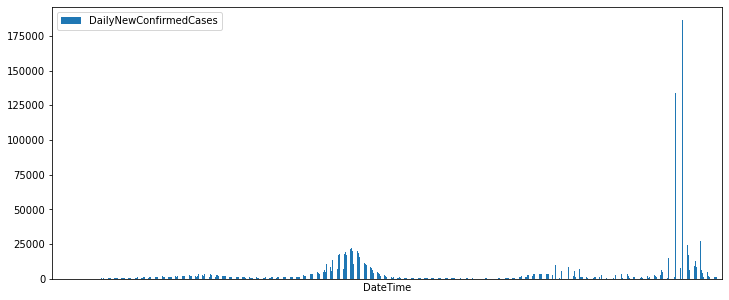

In [22]:
# Create a quick plot of Daily New Confirmed Cases in LA
ax = LA.plot.bar(x='DateTime', y='DailyNewConfirmedCases', rot= 0, figsize = (12,5))

# Remove xticks
ax.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

plt.show()

# References: 
# [Remove xticks] https://stackoverflow.com/questions/12998430/remove-xticks-in-a-matplotlib-plot
# [Configure plot size] https://stackoverflow.com/questions/51174691/how-to-increase-image-size-of-pandas-dataframe-plot-in-jupyter-notebook/51174822

#### We can see some artificial weekly patterns in the daily data, so a 7-day average is necessary

In [23]:
# Calculate 7-day Simple Moving Average
# (takes around 2 minutes)
# Reference: https://www.datacamp.com/community/tutorials/moving-averages-in-pandas

# Set moving average window = 7 days
SMA_Window = 7

# Copy the dataframe
df = confirmed_daily

# Do calculation
for fips in df.countyFIPS.unique():
    for name in dailyCols:
        field = f'{name}_{SMA_Window}DayAverage'
        column_index = df.columns.get_loc(name)
        df.loc[df['countyFIPS'] == fips, field] = df.loc[df['countyFIPS'] == fips].iloc[:, column_index].rolling(window=SMA_Window).mean()  

In [24]:
# Round the moving average fields
movingAverageCols = [f'{name}_{SMA_Window}DayAverage' for name in dailyCols]
for name in movingAverageCols:
    df[name] = round(df[name])
df.tail()

,countyFIPS,DateTime,ConfirmedCases,County Name,State,population,DailyNewConfirmedCases,DailyNewConfirmedCases_7DayAverage
2416193,56045,2022-02-24,1538,Weston County,WY,6927,0.0,1.0
2416194,56045,2022-02-25,1538,Weston County,WY,6927,0.0,1.0
2416195,56045,2022-02-26,1538,Weston County,WY,6927,0.0,1.0
2416196,56045,2022-02-27,1538,Weston County,WY,6927,0.0,1.0
2416197,56045,2022-02-28,1541,Weston County,WY,6927,3.0,2.0


In [25]:
df.head(10)

,countyFIPS,DateTime,ConfirmedCases,County Name,State,population,DailyNewConfirmedCases,DailyNewConfirmedCases_7DayAverage
0,1001,2020-01-22,0,Autauga County,AL,55869,0.0,NaN
1,1001,2020-01-23,0,Autauga County,AL,55869,0.0,NaN
2,1001,2020-01-24,0,Autauga County,AL,55869,0.0,NaN
3,1001,2020-01-25,0,Autauga County,AL,55869,0.0,NaN
4,1001,2020-01-26,0,Autauga County,AL,55869,0.0,NaN
5,1001,2020-01-27,0,Autauga County,AL,55869,0.0,NaN
6,1001,2020-01-28,0,Autauga County,AL,55869,0.0,0.0
7,1001,2020-01-29,0,Autauga County,AL,55869,0.0,0.0
8,1001,2020-01-30,0,Autauga County,AL,55869,0.0,0.0
9,1001,2020-01-31,0,Autauga County,AL,55869,0.0,0.0


#### Also need to cut off the first 6 days since the first moving average value starts from 7th day

In [26]:
firstMADay = df['DateTime'].iloc[0] + pd.DateOffset(days=SMA_Window-1)
firstMADay

Timestamp('2020-01-28 00:00:00')

In [27]:
df_fromFirstMADay = df.loc[df['DateTime'] >= firstMADay]

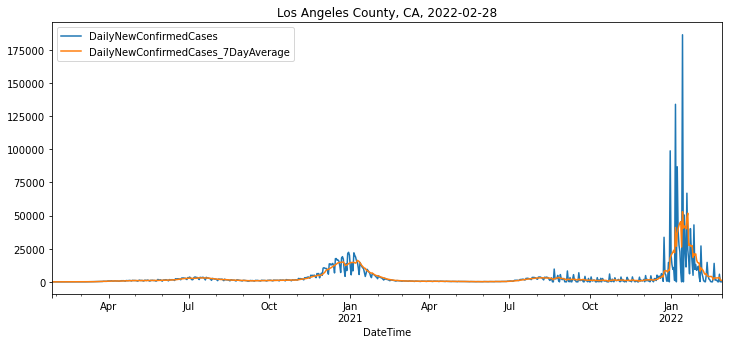

In [28]:
# Check moving average result for LA county - Daily new confirmed cases
FIPS = 6037 # LA
# FIPS = 36061 # Manhattan
# FIPS = 53033 # King County, WA
df = df_fromFirstMADay
currentDate = max(df['DateTime']).strftime("%Y-%m-%d")
countyName = df.loc[df['countyFIPS'] == FIPS, 'County Name'].iloc[0]
stateName = df.loc[df['countyFIPS'] == FIPS, 'State'].iloc[0]
plotTitle = f"{countyName}, {stateName}, {currentDate}"

df_LA = df.loc[df['countyFIPS'] == FIPS][['DateTime','DailyNewConfirmedCases', f'DailyNewConfirmedCases_{SMA_Window}DayAverage']]
df_LA = df_LA.set_index('DateTime')
lines = df_LA.plot.line(figsize = (12,5), title = plotTitle)
plt.show()

## Step 4: Calculate per 100K residents data 

- Cumulative Confirmed Cases per 100K
- Daily new confirmed cases per 100K
- 7-day moving average of Daily new confirmed cases per 100K

In [29]:
# Disable the SettingWithCopy warning 
# Reference: https://stackoverflow.com/questions/20625582/how-to-deal-with-settingwithcopywarning-in-pandas
pd.options.mode.chained_assignment = None 

# Calculate the per 100K data and round 
originalCols = ['ConfirmedCases', 'DailyNewConfirmedCases', 'DailyNewConfirmedCases_7DayAverage']
for column in originalCols:
    newColumn = f'{column}_per100K'
    df_fromFirstMADay[newColumn] = round(df_fromFirstMADay[column] / df_fromFirstMADay['population'] * 100000)

In [30]:
df_fromFirstMADay.tail()

,countyFIPS,DateTime,ConfirmedCases,County Name,State,population,DailyNewConfirmedCases,DailyNewConfirmedCases_7DayAverage,ConfirmedCases_per100K,DailyNewConfirmedCases_per100K,DailyNewConfirmedCases_7DayAverage_per100K
2416193,56045,2022-02-24,1538,Weston County,WY,6927,0.0,1.0,22203.0,0.0,14.0
2416194,56045,2022-02-25,1538,Weston County,WY,6927,0.0,1.0,22203.0,0.0,14.0
2416195,56045,2022-02-26,1538,Weston County,WY,6927,0.0,1.0,22203.0,0.0,14.0
2416196,56045,2022-02-27,1538,Weston County,WY,6927,0.0,1.0,22203.0,0.0,14.0
2416197,56045,2022-02-28,1541,Weston County,WY,6927,3.0,2.0,22246.0,43.0,29.0


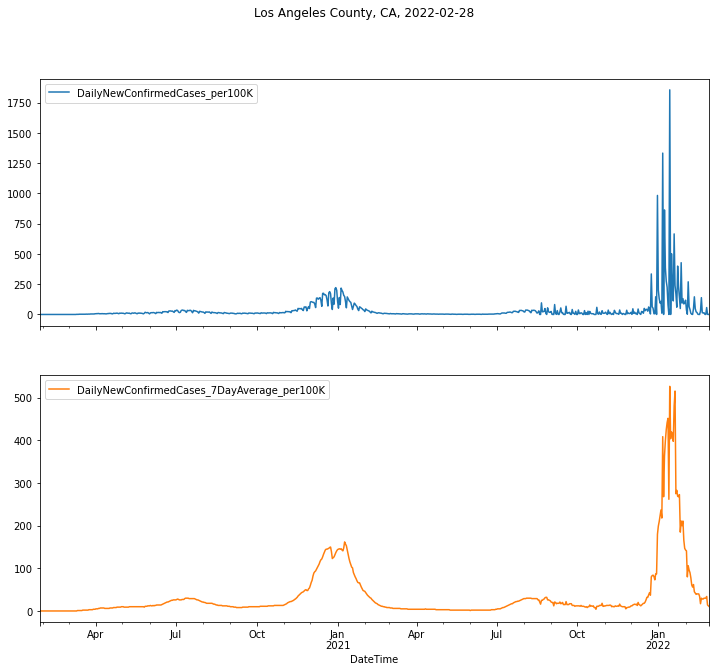

In [31]:
# Check per 100K residents data vs. per 100K 7-day average data
df_LA = df.loc[df['countyFIPS'] == FIPS][['DateTime','DailyNewConfirmedCases_per100K', f'DailyNewConfirmedCases_{SMA_Window}DayAverage_per100K']]
df_LA = df_LA.set_index('DateTime')
df_LA.plot(subplots=True, figsize=(12, 10), title = plotTitle)
plt.legend(loc='best')
plt.show()

In [32]:
# Convert all numeric columns to int
per100KCols = [f'{column}_per100K' for column in originalCols]
cols = originalCols + per100KCols + ['population']
df_copy = df_fromFirstMADay.copy()
df_copy[cols] = df_copy[cols].applymap(np.int32)
df_copy.dtypes

countyFIPS                                             int64
DateTime                                      datetime64[ns]
ConfirmedCases                                         int32
County Name                                           object
State                                                 object
population                                             int32
DailyNewConfirmedCases                                 int32
DailyNewConfirmedCases_7DayAverage                     int32
ConfirmedCases_per100K                                 int32
DailyNewConfirmedCases_per100K                         int32
DailyNewConfirmedCases_7DayAverage_per100K             int32
dtype: object

In [33]:
# Export pandas dataframe to CSV
date = pd.to_datetime(lastDate_confirmed, format = '%Y/%m/%d').strftime('%m%d')
MA_csv = os.path.join(workFolder, f"confirmed_{date}.csv")
df_copy.to_csv(MA_csv)
MA_csv

'C:\\Users\\albe9057\\Documents\\ArcGIS\\Projects\\Covid-19 Notebook Testing\\Downloaded Data\\confirmed_0228.csv'

## Step 5: Create Space Time Cube using Defined Locations with ArcPy

When using this data in a space time cube, the cases are aggregated spatially (counties) and temporally (daily, weekly, monthly).

This section will create space time cubes for each temporal aggregation. Additionally, we can also create cubes containing spatial and temporal subsets of the data: 
    - cube for one state, ex. California
    - cube for a certain time period, ex. 7/1/2020 - 12/31/2020.

#### We need to get a county layer for geometry 

A useful source of data is the [ArcGIS Living Atlas of the World](https://livingatlas.arcgis.com), where we can find a service containing [USA Counties](https://www.arcgis.com/home/item.html?id=7566e0221e5646f99ea249a197116605). 

In [34]:
# Authenticate with a GIS using the ArcGIS API for Python
gis = arcgis.gis.GIS()

In [35]:
# Search for USA_Counties
search = gis.content.search("USA Counties", item_type="feature_service", outside_org=True, sort_field="numViews")
# Use the correct index to reference the search result
counties_item = search[1]
counties_item

<Item title:"USA Counties (Generalized)" type:Feature Layer Collection owner:esri_dm>

In [36]:
# Load the dataset into a spatially-enabled dataframe
counties_sedf = pd.DataFrame.spatial.from_layer(counties_item.layers[0])
counties_sedf = counties_sedf[['OBJECTID', 'NAME', 'STATE_NAME', 'FIPS', 'SHAPE', 'Shape__Area', 'Shape__Length']]
counties_sedf["NFIPS"] = counties_sedf["FIPS"].astype(int)
counties_sedf

,OBJECTID,NAME,STATE_NAME,FIPS,SHAPE,Shape__Area,Shape__Length,NFIPS
0,1,Aleutians East,Alaska,02013,"{""rings"": [[[-17677357.9077045, 7719547.390490...",4.886230e+10,3.299975e+06,2013
1,1201,Traill,North Dakota,38097,"{""rings"": [[[-10779852.8004753, 5981411.784141...",4.881826e+09,2.837745e+05,38097
2,1202,Walsh,North Dakota,38099,"{""rings"": [[[-10898454.0980662, 6139525.267360...",7.683728e+09,4.117952e+05,38099
3,2,Aleutians West,Alaska,02016,"{""rings"": [[[-18550860.9655057, 7080282.503091...",1.831491e+10,2.455085e+06,2016
4,1203,Ward,North Dakota,38101,"{""rings"": [[[-11239339.6270714, 6082615.148233...",1.192105e+10,5.964787e+05,38101
...,...,...,...,...,...,...,...,...
3137,2796,Harford,Maryland,24025,"{""rings"": [[[-8500769.3667677, 4778178.7092085...",1.924485e+09,1.729592e+05,24025
3138,2797,Howard,Maryland,24027,"{""rings"": [[[-8554168.91327967, 4735755.817128...",1.053862e+09,1.500149e+05,24027
3139,2798,Kent,Maryland,24029,"{""rings"": [[[-8472632.42062548, 4738689.452533...",1.048614e+09,1.657144e+05,24029
3140,2799,Montgomery,Maryland,24031,"{""rings"": [[[-8572483.63349163, 4716898.046870...",2.151946e+09,2.089930e+05,24031


In [37]:
# Save the spatially-enabled dataframe into a Feature Class
counties_fc = counties_sedf.spatial.to_featureclass(os.path.join(workGDB, "usa_counties"))

#### Helper function to convert CSV to a Space Time Cube

In [38]:
def createCubeFromCSV_withMA(csvWithPath, workFolder, daily = True, weekly = False, monthly = False):
    ### Function to create cube with 7-day moving average & per 100K residents ###
    ### Also can aggregate daily data to weekly and monthly (30-day actually) ###
    csv = os.path.basename(csvWithPath)
    tb = csv.split(".")[0]
    # output cube = use the same name with CSV, will be saved at workFolder
    outputCube = os.path.join(workFolder, tb + ".nc")
    
    # template feature = US counties polygons
    gdb = workGDB
    templateFC = os.path.join(workGDB, "usa_counties")
    # Convert csv to a table in data.gdb
    arcpy.conversion.TableToTable(csvWithPath, gdb, tb)
    tbName = os.path.join(gdb, tb)
    
    if daily:
        # Create Space Time Cube From Defined Locations - daily
        arcpy.stpm.CreateSpaceTimeCubeDefinedLocations(templateFC, outputCube, "NFIPS", "NO_TEMPORAL_AGGREGATION", "DateTime", "1 Days", "END_TIME", None, "ConfirmedCases DROP_LOCATIONS;DailyNewConfirmedCases DROP_LOCATIONS;DailyNewConfirmedCases_7DayAverage DROP_LOCATIONS;ConfirmedCases_per100K DROP_LOCATIONS;DailyNewConfirmedCases_per100K DROP_LOCATIONS;DailyNewConfirmedCases_7DayAverage_per100K DROP_LOCATIONS;", None, tbName, "countyFIPS")
        print("daily cube created")
    
    if weekly:
        # Create Space Time Cube From Defined Locations - weekly aggregation
        outputCube_weekly = os.path.join(workFolder, f"{tb}_1week.nc")
        arcpy.stpm.CreateSpaceTimeCubeDefinedLocations(templateFC, outputCube_weekly, "NFIPS", "APPLY_TEMPORAL_AGGREGATION", "DateTime", "1 Weeks", "END_TIME", None, None, "DailyNewConfirmedCases SUM DROP_LOCATIONS;DailyNewConfirmedCases_per100K SUM DROP_LOCATIONS", tbName, "countyFIPS")
        print("weekly cube created")
    
    if monthly:
        # Create Space Time Cube From Defined Locations - 30-Day aggregation
        outputCube_monthly = os.path.join(workFolder, f"{tb}_30days.nc")
        arcpy.stpm.CreateSpaceTimeCubeDefinedLocations(templateFC, outputCube_monthly, "NFIPS", "APPLY_TEMPORAL_AGGREGATION", "DateTime", "30 Days", "END_TIME", None, None, "DailyNewConfirmedCases SUM DROP_LOCATIONS;DailyNewConfirmedCases_per100K SUM DROP_LOCATIONS", tbName, "countyFIPS")
        print("monthly cube created")
    return

##### This step may take a few moments to run...

In [39]:
# Create cube with 7-day moving average & per 100K residents
createCubeFromCSV_withMA(MA_csv, workFolder, daily=True, weekly=True, monthly=True)

daily cube created
weekly cube created
monthly cube created


#### Optional: Create cube for selected counties or state.

In [40]:
# Create small cube for five counties in NYC
FIPS = [36061, 36085, 36005, 36047, 36081]
nyc_csv = os.path.join(workFolder, f'confirmed_NYC_thru_{date}.csv')
df_nyc = df_copy.loc[df_copy['countyFIPS'].isin(FIPS)]
df_nyc.to_csv(nyc_csv)
createCubeFromCSV_withMA(nyc_csv, workFolder)

daily cube created


In [41]:
# Create small cube for California
ca_csv = os.path.join(workFolder, f'confirmed_CA_thru_{date}.csv')
df_CA = df_copy.loc[(df_copy['countyFIPS'] >= 6000) & (df_copy['countyFIPS'] <= 6115)]
df_CA.to_csv(ca_csv)
createCubeFromCSV_withMA(ca_csv, workFolder)

daily cube created


In [42]:
# Create small cube for Florida
fl_csv = os.path.join(workFolder, f'confirmed_FL_thru_{date}.csv')
df_FL= df_copy.loc[(df_copy['countyFIPS'] >= 12001) & (df_copy['countyFIPS'] <= 12999)]
df_FL.to_csv(fl_csv)
createCubeFromCSV_withMA(fl_csv, workFolder)

daily cube created


#### Optional: Create cube for selected time period

In [43]:
# Create cube for a certain time period
start_date = '2021-11-01'
end_date = '2022-02-15'
separator = ''
startDateString = separator.join(start_date.split('-')[1:])
endDateString = separator.join(end_date.split('-')[1:])
certainDates_csv = os.path.join(workFolder, f'confirmed_from_{startDateString}_to_{endDateString}.csv')

df_only_certainDates = df_copy.loc[(df_fromFirstMADay['DateTime'] >= start_date) & (df_copy['DateTime'] <= end_date)]
df_only_certainDates.to_csv(certainDates_csv)
createCubeFromCSV_withMA(certainDates_csv, workFolder)

daily cube created


# 2. Data Visualization

Reference: 
<a href="https://www.arcgis.com/home/item.html?id=5e08c75b489c416ca607f8a6a7f5c344" target="_blank">ArcGIS Notebook - Using Arcpy Charts to Visualize COVID</a>

- <b>Bar Chart</b>: Total Covid-19 Cases by County
- <b>Calendar Heat Chart</b>: Total COVID-19 Cases by Day and Month
- <b>Matrix Heat Chart</b>: Daily COVID-19 Cases by County

In [44]:
# Read the table of California from Contents in your activated Map
groupField = 'County_Name'
table = arcpy.mp.ArcGISProject('current').activeMap.listTables()[0]
table.name

'confirmed_0228'

In [45]:
# If we are interested in the nation-wide situation and group by States, run this cell to use a different table
groupField = 'State'
table = arcpy.mp.ArcGISProject('current').activeMap.listTables()[0]
table.name

'confirmed_0228'

First, start with a simple <b>bar chart showing the total COVID cases for each county in Califronia</b>. 

To do so, we initialize an ArcPy Chart object c and configuring the properties: type of chart, title, axis fields, axis titles, sorted by descending of Y axis values, and display size (width, length). Since there are multile rows for each date of a single county, we use a sum aggregation to calculate the total daily new cases as the total confirmed cases for each county, by chart object's `bar.aggregation` property. Also take note of the dataSource property, which is pointed to the table variable read in the previous cell(s), to specify the feature layer/stand-alone table you want to create chart based off. If it's not listed in TOC, you can point it to the full path of the feature class. 

After the ArcPy Chart object is created, we can: 1) export it to a local SVG file by the chart object's `exportToSVG` method, 2) add it to the feature layer/stand-alone table in TOC by the `addToLayer` method, 3) show under the cell in ArcGIS Notebook.


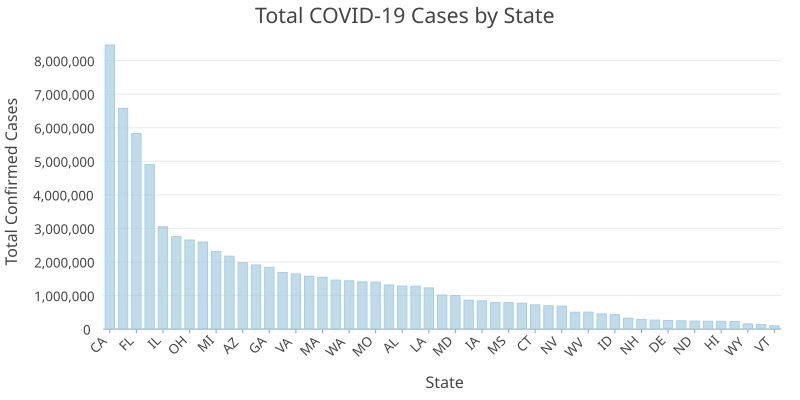

In [46]:
c = arcpy.Chart('covid19_sum_by_county_desc')
c.type = 'bar'
groupTitle = groupField.split('_')[0]
c.title = f"Total COVID-19 Cases by {groupTitle}"
c.xAxis.field = groupField
c.xAxis.title = groupTitle
c.yAxis.field = 'DailyNewConfirmedCases'
c.yAxis.title = "Total Confirmed Cases"
c.yAxis.sort = 'DESC'
c.bar.aggregation = 'sum'
c.displaySize = 800, 400
c.dataSource = table
# c.exportToSVG('covid19_sum_by_county_desc.svg')
c.addToLayer(table) 
c

We can also view aggregated COVID-19 cases over time from a slightly different perspective by creating a <a href="https://pro.arcgis.com/en/pro-app/latest/help/analysis/geoprocessing/charts/calendar-heat-chart.htm" target="_blank">calendar heat chart</a>. <b>This chart aggregates daily new cases of all counties in California and displays them in a calendar grid.</b> The calendar heat chart is effective at showing a per day summary of temporal data, and the color for each cell is determined by a graduated natural breaks scheme.

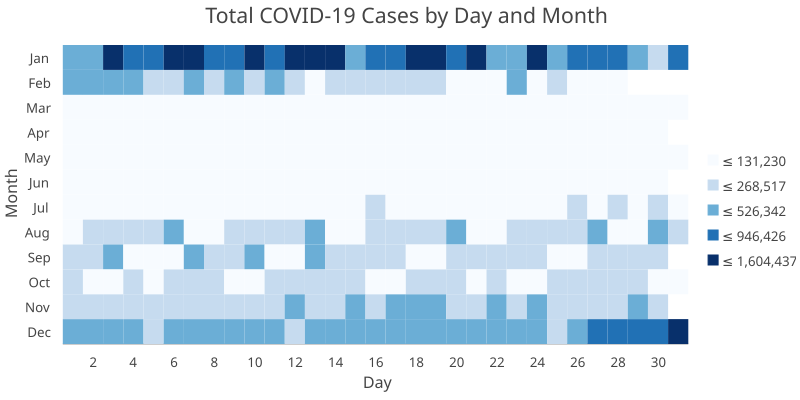

In [47]:
c = arcpy.Chart('covid19_calendar')
c.type = 'calendarHeatChart'
c.title = "Total COVID-19 Cases by Day and Month"
c.xAxis.field = 'DateTime'
c.xAxis.title = "Day"
c.yAxis.field = 'DailyNewConfirmedCases'
c.yAxis.title = "Month"
c.calendarHeatChart.aggregation = 'sum'
c.displaySize = 800, 400
c.dataSource = table
# c.exportToSVG('covid19_calendar.svg')
c.addToLayer(table) 
c

Having visualized the daily new COVID-19 cases aggregated for the entire state, we may also be interested in <b>comparing daily cases between counties within California</b>. 

New in ArcGIS Pro 2.7, we can display this data by creating a <a href="https://pro.arcgis.com/en/pro-app/latest/help/analysis/geoprocessing/charts/matrix-heat-chart.htm#GUID-44D462F3-5E67-46DD-BD1C-862003D2EA5C" target="_blank">matrix heat chart</a> to display each county in a separate row. Matrix heat charts are used to visualize relationships between categorical or date fields with a grid of shaded cells. Here we will view each day on the X-axis by set the chart object's `xAxis.field` property, or Column category in the Chart Properties Pane. To view each county on the Y-axis, and use `DailyNewConfirmedCases` field to determine the intensity of the cell shading, we need to parse a list of the two Field names to the chart object's `yAxis.field` property. Also we can specify the symbology of the cell shading using 7-category Natural Breaks.

In [48]:
c = arcpy.Chart('covid19_daily_by_county')
c.type = 'matrixHeatchart'
c.title = f"Daily COVID-19 Cases by {groupTitle}"
c.xAxis.field = 'DateTime'
c.xAxis.title = 'Day'
c.yAxis.field = [groupField, 'DailyNewConfirmedCases']
c.yAxis.title = groupTitle
c.matrixHeatChart.aggregation = 'sum'
c.matrixHeatChart.classificationMethod = 'naturalBreaks'
c.matrixHeatChart.classCount = 7
c.matrixHeatChart.nullPolicy = 'zero'
c.legend.title = "Number of Cases"
c.displaySize = 800, 1200
c.dataSource = table
# c.exportToSVG('covid19_daily_by_county.svg')
c.addToLayer(table)
c

# 3. Analysis

There are various tools that can be used to analyze COVID-19 cases across space and time. In this section, we'll apply two methods: 
- Time Series Clustering
- Change Point Detection. 

By using a notebook and recording the arcpy calls in this script, we can make it easy to repeat and share the analysis. 

## Time Series Clustering

In [49]:
def clustering(inCube, field, outputName, runProfile = True, runFourier = True, runValue= False, numClusters = None, ignore = None, createPopups = True):
    """ Cluster with three Characteristics of Interests together 
    
    Keyword arguments:
    inCube -- Input Space Time Cube with full path (string)
    field -- Cube Variable (string)
    runProfile -- Boolean for using Profile (Correlation) as character of interest (boolean, default = True)
    runFourier -- Boolean for using Profile (Fourier) as character of interest (boolean, default = True)
    runValue -- Boolean for using Value as character of interest (boolean, default = False)
    numClusters -- Number of clusters (int, default = None, auto-detect the optimal # clsuter with min F-stats)
    ignore -- Time Series Characteristics to Ignore, "TIME_LAG"|"RANGE" (string, default = None)
    createPopups -- Boolean for Enable Time Series Pop-ups in output feature (boolean, default = True)
    """
    # Run Profile (Correlation)
    if runProfile:
        outputFc = os.path.join(workGDB, f"{outputName}_TSC_Profile")
        outputChart = os.path.join(workGDB, f"{outputName}_TSC_Profile_Charts")
        arcpy.stpm.TimeSeriesClustering(inCube, field, outputFc, "PROFILE", numClusters, outputChart, None, createPopups)
    # Run Profile (Fourier)
    if runFourier:
        outputFc = os.path.join(workGDB, f"{outputName}_TSC_Fourier")
        outputChart = os.path.join(workGDB, f"{outputName}_TSC_Fourier_Charts")
        arcpy.stpm.TimeSeriesClustering(inCube, field, outputFc, "PROFILE_FOURIER", numClusters, outputChart, ignore, createPopups)
    # Run Profile (Value)
    if runValue:
        outputFc = os.path.join(workGDB, f"{outputName}_TSC_Value")
        outputChart = os.path.join(workGDB, f"{outputName}_TSC_Value_Charts")
        arcpy.stpm.TimeSeriesClustering(inCube, field, outputFc, "VALUE", numClusters, outputChart, None, createPopups)
    return

#### This cell will take a significantly long time to run...

In [50]:
# Input parameters for time series clustering
cube = f"confirmed_{date}.nc"
inCube = os.path.join(workFolder, cube)
field = "DAILYNEWCONFIRMEDCASES_7DAYAVERAGE_PER100K"
outputName = f"US_7dayAvgDailyCasesPer100K_thru_{date}"

# Clustering
clustering(inCube, field, outputName)

## Change Point Detection

In [51]:
def changepoint(inCube, field, outputName, runMean=True, runCount=True, runStdDev=True, runSlope=False):
    """ Cluster with three Characteristics of Interests together 
    
    Keyword arguments:
    inCube -- Input Space Time Cube with full path (string)
    field -- Cube Variable (string)
    outputName -- Output name for the layer (string)
    runMean -- Boolean for using Mean change point detection (boolean, default = True)
    runCount -- Boolean for using Mean change point detection (boolean, default = True)
    runStdDev -- Boolean for using Mean change point detection (boolean, default = True)
    numSlope -- Boolean for using Mean change point detection (boolean, default = True)

    createPopups -- Boolean for Enable Time Series Pop-ups in output feature (boolean, default = True)
    """
    if runMean:
        outputFc = os.path.join(workGDB, f"{outputName}_CPD_Mean")
        arcpy.stpm.ChangePointDetection(inCube, field, outputFc, "MEAN", "AUTO_DETECT", 1, 0.5)
    if runCount:
        outputFc = os.path.join(workGDB, f"{outputName}_CPD_Count")
        arcpy.stpm.ChangePointDetection(inCube, field, outputFc, "COUNT", "AUTO_DETECT", 1, 0.5)        
    if runStdDev:
        outputFc = os.path.join(workGDB, f"{outputName}_CPD_StdDev")
        arcpy.stpm.ChangePointDetection(inCube, field, outputFc, "STANDARD_DEVIATION", "AUTO_DETECT", 1, 0.5)   
    if runSlope:
        outputFc = os.path.join(workGDB, f"{outputName}_CPD_Slope")
        arcpy.stpm.ChangePointDetection(inCube, field, outputFc, "SLOPE", "AUTO_DETECT", 1, 0.5)           
    return

#### This cell will take a few minutes to run...

In [52]:
# Input parameters for time series clustering
cube = f"confirmed_{date}.nc"
inCube = os.path.join(workFolder, cube)
field = "DAILYNEWCONFIRMEDCASES_7DAYAVERAGE_PER100K"
outputName = f"US_7dayAvgDailyCasesPer100K_thru_{date}"

# Change Point Detection
changepoint(inCube, field, outputName)